# CE639: AI for Civil Engineering
## Lecture 04: Optimization and Loss Landscapes
### Scientific Computing Fundamentals

**Instructors:** Dr. Udit Bhatia & Dr. Sushobhan Sen  
**Tutor:** Sarth Dubey  
**Institution:** IIT Gandhinagar

---

### Learning Objectives

By the end of this notebook, you will be able to:
- Perform gradient descent optimization
- Explain the difference between convex and non-convex surfaces
- Explain the importance of bias-variance trade-off in AI/ML
- Define regularization and its uses in AI/ML

## 🔧 Setup and Installation

In [1]:
# Install dependencies (for Google Colab)
import sys
import subprocess

def install_package(package):
    """Install a package using pip."""
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", package])

# Check if running in Colab
try:
    import google.colab
    IN_COLAB = True
    print("Running in Google Colab ✓")
except:
    IN_COLAB = False
    print("Running locally ✓")

# # Install required packages
# required_packages = ['numpy', 'matplotlib', 'scipy', 'ipywidgets']
# for package in required_packages:
#     try:
#         __import__(package)
#     except ImportError:
#         print(f"Installing {package}...")
#         install_package(package)

print("\n✓ All packages installed successfully!")

Running locally ✓

✓ All packages installed successfully!


In [ ]:
if IN_COLAB:
    # !git clone https://github.com/dubeysarth/2026_IITGN_CE639
    # %cd 2026_IITGN_CE639
    subprocess.run(['git', 'clone', 'https://github.com/dubeysarth/2026_IITGN_CE639'])
    os.chdir('2026_IITGN_CE639')

In [2]:
# Import standard libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy import optimize
from IPython.display import display, HTML
import warnings
warnings.filterwarnings('ignore')

# Configure matplotlib
plt.rcParams['figure.dpi'] = 100
plt.rcParams['font.size'] = 10
%matplotlib inline

# Import our custom helper utilities
import sys
sys.path.append('/content')  # For Colab
sys.path.append('..')  # For local

from utils.Lecture_04 import (
    # Optimizers
    gradient_descent, stochastic_gradient_descent, adam_optimizer,
    compute_gradient, learning_rate_schedule,
    # Loss Functions
    mse_loss, mse_gradient, mse_with_l1_reg, mse_with_l2_reg,
    mse_with_elastic_net, quadratic_bowl, rosenbrock, himmelblau,
    # Visualizations
    plot_loss_landscape_2d, plot_loss_landscape_3d, animate_gradient_descent,
    plot_learning_rate_comparison, plot_convex_vs_nonconvex,
    plot_bias_variance_tradeoff, plot_regularization_paths, plot_gradient_field,
    # Widgets
    learning_rate_widget, gd_comparison_widget, convexity_widget,
    bias_variance_widget, regularization_widget,
    # CE Examples
    create_structural_optimization, create_cost_function, create_regression_data,
    simulate_overfitting, demonstrate_dropout
)

print("✓ All imports successful!")
print("=" * 70)
print("Ready to explore Optimization and Loss Landscapes!")
print("=" * 70)

✓ All imports successful!
Ready to explore Optimization and Loss Landscapes!


# 📊 Section 1: Motivation - Why Optimization?

## Optimization in Civil Engineering

**What do you understand by optimization?**
- Finding the "best" solution from all feasible solutions
- Minimizing cost, weight, or risk
- Maximizing strength, efficiency, or safety

**What are things in CE optimized for?**
- **Structural Design:** Minimize material cost while meeting strength requirements
- **Transportation:** Minimize travel time or fuel consumption
- **Water Resources:** Optimize reservoir operations
- **Construction:** Minimize project duration and cost

**Challenges in CE optimization:**
- Multiple conflicting objectives
- Complex constraints (safety, regulations)
- Uncertainty in loads and materials
- High-dimensional design spaces

## Optimization in AI/ML

Most AI models are trained by solving an optimization problem:

$$\theta^* = \arg\min_{\theta} L(\theta)$$

where:
- $\theta \in \mathbb{R}^d$ are model parameters ($d \gg 1$, often millions!)
- $L(\theta)$ is the **loss function** (measures how bad predictions are)

**Common loss functions:**
- **Mean Squared Error (MSE):** Linear regression
- **Cross-Entropy:** Classification
- **Hinge Loss:** Support Vector Machines

**Challenge:** We usually lack closed-form solutions, so we rely on **iterative optimization algorithms**

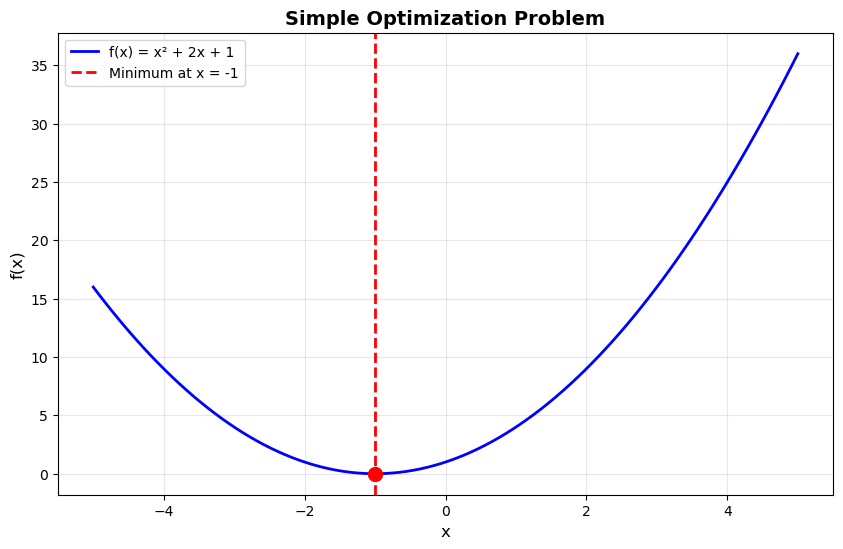

Analytical minimum: x* = -1
Minimum value: f(-1) = 0


In [3]:
# Simple example: Finding minimum of a quadratic function
x = np.linspace(-5, 5, 100)
y = x**2 + 2*x + 1  # f(x) = (x+1)²

plt.figure(figsize=(10, 6))
plt.plot(x, y, 'b-', linewidth=2, label='f(x) = x² + 2x + 1')
plt.axvline(-1, color='r', linestyle='--', linewidth=2, label='Minimum at x = -1')
plt.plot(-1, 0, 'ro', markersize=10)
plt.xlabel('x', fontsize=12)
plt.ylabel('f(x)', fontsize=12)
plt.title('Simple Optimization Problem', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print("Analytical minimum: x* = -1")
print("Minimum value: f(-1) = 0")

# 🎯 Section 2: Gradient Descent Basics

## The Gradient

The **gradient** of a function $L(\theta)$ is:

$$\nabla L(\theta) = \begin{bmatrix} \frac{\partial L}{\partial \theta_1} \\ \frac{\partial L}{\partial \theta_2} \\ \vdots \\ \frac{\partial L}{\partial \theta_d} \end{bmatrix}$$

**Key Properties:**
- The gradient is a **vector** in $\theta$ space
- Points in the direction of **steepest increase**
- Magnitude indicates how steep the increase is

**Intuition:** If you're on a hill, the gradient points uphill. To go downhill (minimize), move in the **negative gradient direction**!

## Gradient Descent Algorithm

**Update Rule:**

$$\theta_{t+1} = \theta_t - \eta \nabla L(\theta_t)$$

where:
- $\theta_t$: parameters at iteration $t$
- $\eta > 0$: **learning rate** (step size)
- $\nabla L(\theta_t)$: gradient at current position

**Algorithm:**
1. Initialize $\theta_0$ (random or zeros)
2. Repeat until convergence:
   - Compute gradient $\nabla L(\theta_t)$
   - Update: $\theta_{t+1} = \theta_t - \eta \nabla L(\theta_t)$
3. Return $\theta^*$

In [4]:
# Demonstrate gradient descent on a simple 2D function
loss_fn = quadratic_bowl  # f(x, y) = x² + y²
grad_fn = lambda theta: compute_gradient(loss_fn, theta)

# Initial point
theta_init = np.array([3.0, 3.0])

# Run gradient descent
result = gradient_descent(loss_fn, grad_fn, theta_init, 
                         learning_rate=0.1, max_iters=50)

print("Gradient Descent Results:")
print(f"  Initial θ: {theta_init}")
print(f"  Final θ: {result['theta']}")
print(f"  Initial loss: {loss_fn(theta_init):.6f}")
print(f"  Final loss: {result['loss']:.6f}")
print(f"  Iterations: {result['iterations']}")

Gradient Descent Results:
  Initial θ: [3. 3.]
  Final θ: [4.28174308e-05 4.28174308e-05]
  Initial loss: 18.000000
  Final loss: 0.000000
  Iterations: 50


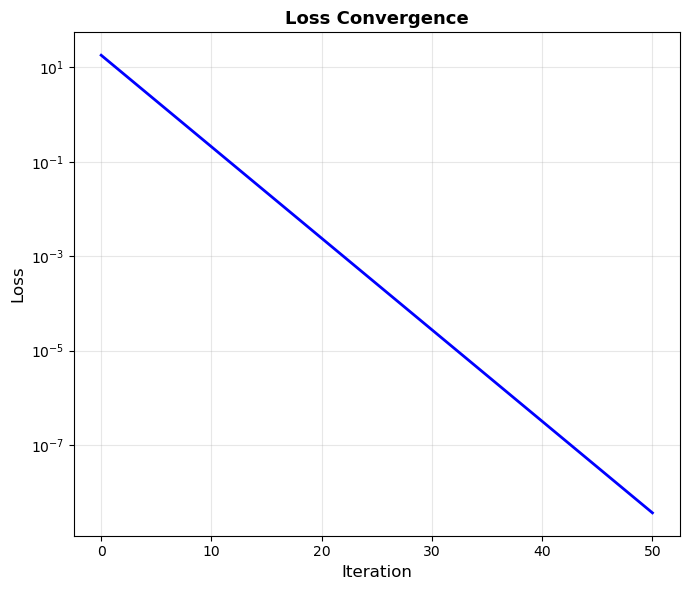

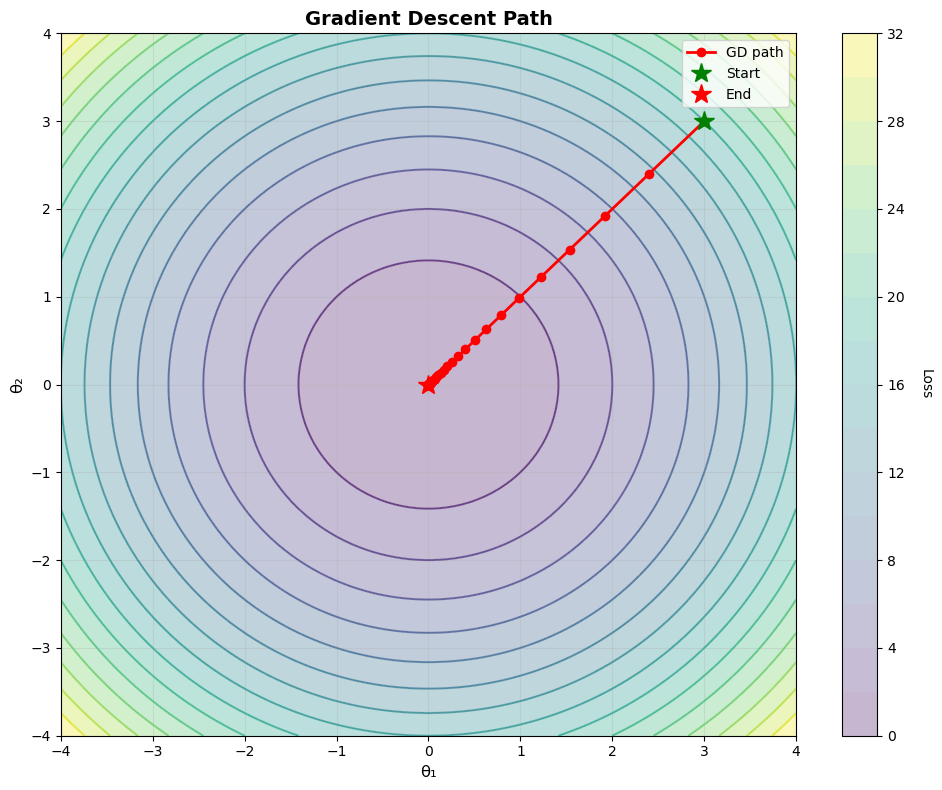

In [8]:
# Visualize the optimization path

# Loss history
fig, ax1 = plt.subplots(1, 1, figsize=(7, 6))
ax1.plot(result['loss_history'], 'b-', linewidth=2)
ax1.set_xlabel('Iteration', fontsize=12)
ax1.set_ylabel('Loss', fontsize=12)
ax1.set_title('Loss Convergence', fontsize=13, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.set_yscale('log')
plt.tight_layout()
plt.show()

# Trajectory on contour plot
_, ax2, _, _, _ = plot_loss_landscape_2d(loss_fn, (-4, 4), (-4, 4), 
                                          title='Gradient Descent Path')
ax2.plot(result['theta_history'][:, 0], result['theta_history'][:, 1], 
        'ro-', linewidth=2, markersize=6, label='GD path')
ax2.plot(result['theta_history'][0, 0], result['theta_history'][0, 1], 
        'g*', markersize=15, label='Start')
ax2.plot(result['theta_history'][-1, 0], result['theta_history'][-1, 1], 
        'r*', markersize=15, label='End')
ax2.legend()

plt.tight_layout()
plt.show()

# 📈 Section 3: Learning Rate Effects

## The Learning Rate Hyperparameter

The learning rate $\eta$ is a **hyperparameter** - not trained, but set by the user.

**Effects of $\eta$:**
- **Too small:** Very slow convergence, many iterations needed
- **Too large:** Divergence or oscillation, may overshoot minimum
- **Just right:** Fast, stable convergence

**Key Insight:** Although hyperparameters are not trained, we still need to optimize them (through trial and error or hyperparameter search)

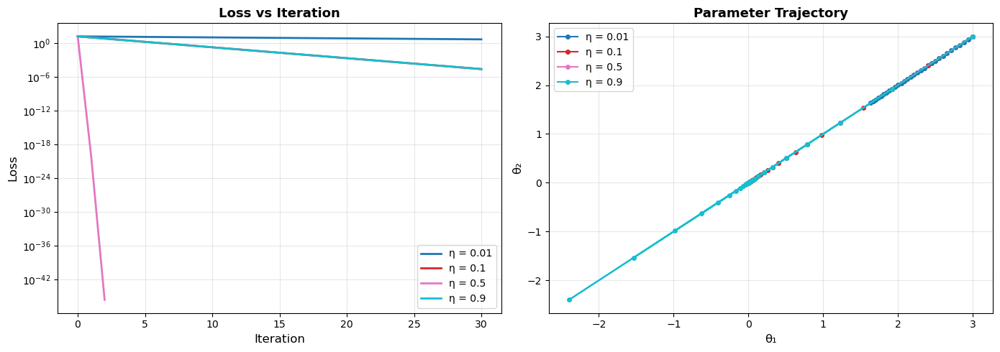

Learning Rate Comparison:
  η = 0.01: Final loss = 5.355957, Iterations = 30
  η = 0.10: Final loss = 0.000028, Iterations = 30
  η = 0.50: Final loss = 0.000000, Iterations = 2
  η = 0.90: Final loss = 0.000028, Iterations = 30


In [10]:
# Compare different learning rates
learning_rates = [0.01, 0.1, 0.5, 0.9]

fig, ax = plot_learning_rate_comparison(loss_fn, grad_fn, theta_init, 
                                        learning_rates, max_iters=30)
plt.show()

print("Learning Rate Comparison:")
for lr in learning_rates:
    result = gradient_descent(loss_fn, grad_fn, theta_init, 
                             learning_rate=lr, max_iters=30)
    print(f"  η = {lr:4.2f}: Final loss = {result['loss']:.6f}, Iterations = {result['iterations']}")

### 🎮 Interactive Widget: Learning Rate Explorer

In [3]:
learning_rate_widget()

interactive(children=(FloatSlider(value=0.1, description='Learning Rate (η):', max=1.0, min=0.01, step=0.01, s…

## Learning Rate Schedules

Instead of fixed $\eta$, use a **schedule** that decreases over time:

**Step Decay:**
$$\eta_t = \eta_0 \cdot \gamma^{\lfloor t / s \rfloor}$$

**Exponential Decay:**
$$\eta_t = \eta_0 \cdot e^{-\lambda t}$$

**Cosine Annealing:**
$$\eta_t = \eta_{min} + \frac{1}{2}(\eta_0 - \eta_{min})(1 + \cos(\frac{\pi t}{T}))$$

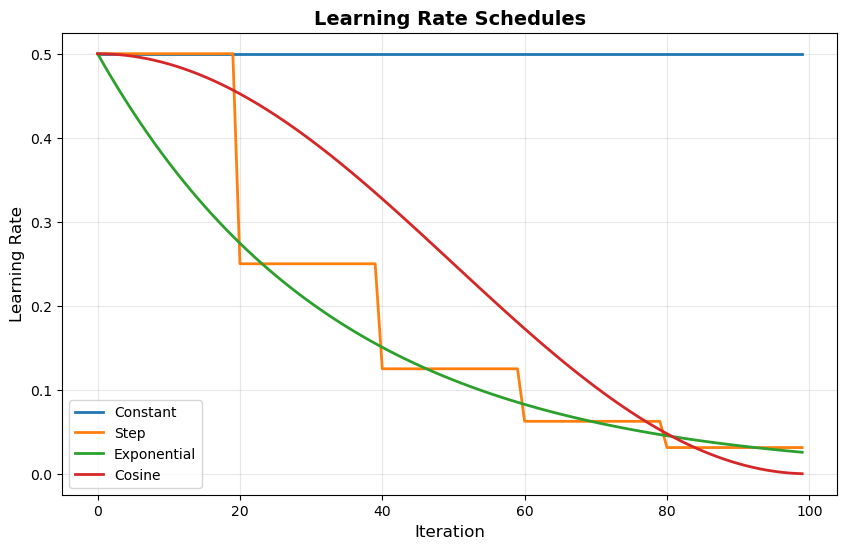

In [12]:
# Demonstrate learning rate schedules
iterations = np.arange(0, 100)
initial_lr = 0.5

schedules = {
    'Constant': [learning_rate_schedule('constant', initial_lr, t) for t in iterations],
    'Step': [learning_rate_schedule('step', initial_lr, t, step_size=20, decay_rate=0.5) for t in iterations],
    'Exponential': [learning_rate_schedule('exponential', initial_lr, t, decay_rate=0.03) for t in iterations],
    'Cosine': [learning_rate_schedule('cosine', initial_lr, t, max_iters=100) for t in iterations]
}

plt.figure(figsize=(10, 6))
for name, lrs in schedules.items():
    plt.plot(iterations, lrs, linewidth=2, label=name)

plt.xlabel('Iteration', fontsize=12)
plt.ylabel('Learning Rate', fontsize=12)
plt.title('Learning Rate Schedules', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# 🔄 Section 4: Batch, SGD, and Minibatch GD

## How to Calculate the Gradient?

For a dataset with $N$ samples, the loss is typically:

$$L(\theta) = \frac{1}{N} \sum_{i=1}^N \ell(y_i, f(x_i; \theta))$$

**Three approaches:**

### 1. Batch Gradient Descent
- Use **entire dataset** to compute gradient
- Accurate but slow for large datasets
- Memory intensive

### 2. Stochastic Gradient Descent (SGD)
- Use **one sample at a time**
- Fast but noisy gradient estimates
- Can escape local minima due to noise

### 3. Minibatch Gradient Descent
- Use **small batches** (e.g., 32, 64, 128 samples)
- Balance between accuracy and speed
- **Most commonly used in practice**

Dataset Information:
  Number of samples: 100
  Number of features: 1 (+ bias)
  True weights: [-7.07685371 -2.10322661]


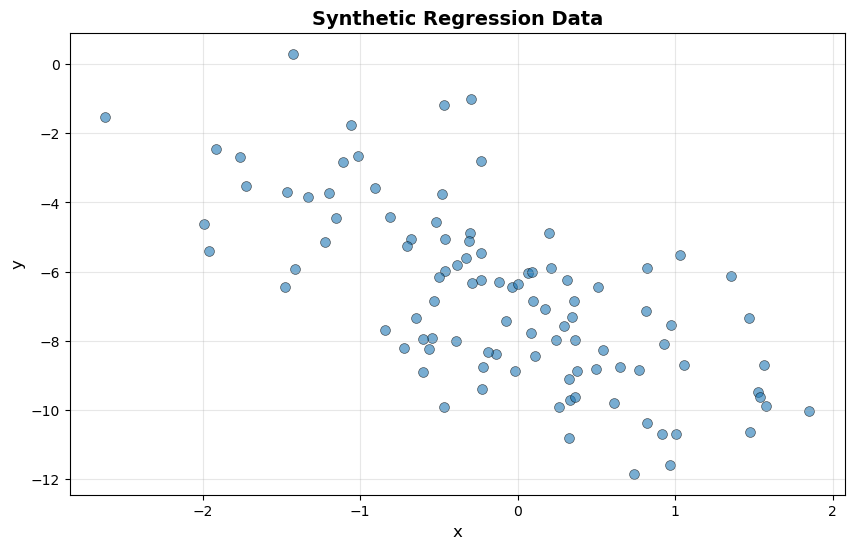

In [13]:
# Generate regression data
data = create_regression_data(n_samples=100, n_features=1, noise_std=2.0, seed=42)
X, y = data['X'], data['y']

print("Dataset Information:")
print(f"  Number of samples: {len(y)}")
print(f"  Number of features: {X.shape[1] - 1} (+ bias)")
print(f"  True weights: {data['true_weights']}")

# Visualize data
plt.figure(figsize=(10, 6))
plt.scatter(X[:, 1], y, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
plt.xlabel('x', fontsize=12)
plt.ylabel('y', fontsize=12)
plt.title('Synthetic Regression Data', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.show()

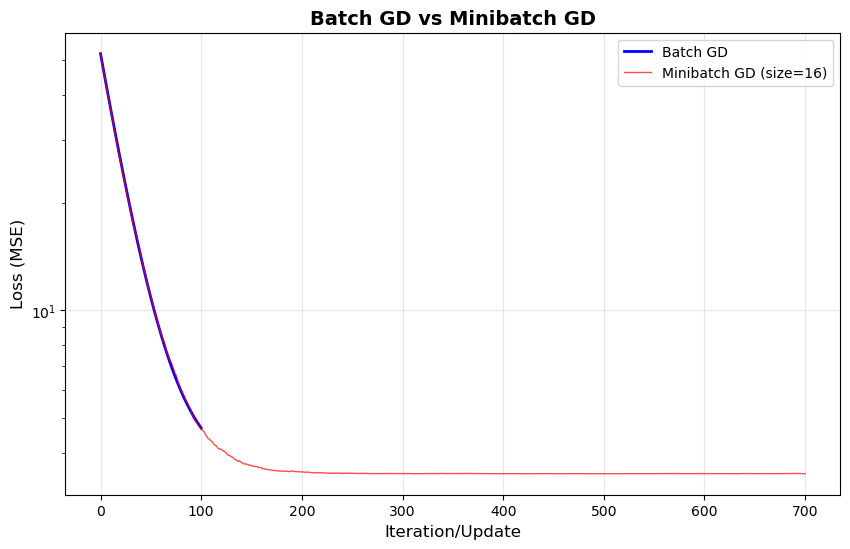

Comparison:
  Batch GD - Final loss: 4.6866
  Minibatch GD - Final loss: 3.4933


In [14]:
# Compare Batch GD vs Minibatch GD
theta_init = np.zeros(X.shape[1])

# Batch GD
loss_fn_batch = lambda theta: mse_loss(theta, X, y)
grad_fn_batch = lambda theta: mse_gradient(theta, X, y)
result_batch = gradient_descent(loss_fn_batch, grad_fn_batch, theta_init,
                               learning_rate=0.01, max_iters=100)

# Minibatch GD
result_minibatch = stochastic_gradient_descent(mse_loss, mse_gradient, theta_init,
                                              X, y, batch_size=16,
                                              learning_rate=0.01, max_epochs=100)

# Plot comparison
plt.figure(figsize=(10, 6))
plt.plot(result_batch['loss_history'], 'b-', linewidth=2, label='Batch GD')
plt.plot(result_minibatch['loss_history'], 'r-', linewidth=1, alpha=0.7, label='Minibatch GD (size=16)')
plt.xlabel('Iteration/Update', fontsize=12)
plt.ylabel('Loss (MSE)', fontsize=12)
plt.title('Batch GD vs Minibatch GD', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.yscale('log')
plt.show()

print("Comparison:")
print(f"  Batch GD - Final loss: {result_batch['loss']:.4f}")
print(f"  Minibatch GD - Final loss: {result_minibatch['loss']:.4f}")

### 🎮 Interactive Widget: GD Comparison

In [15]:
gd_comparison_widget()

interactive(children=(IntSlider(value=16, description='Batch Size:', max=50, min=1, style=SliderStyle(descript…

# 🏔️ Section 5: Convexity

## Convex Functions

A function $f$ is **convex** if:

$$f(\lambda x + (1-\lambda) y) \leq \lambda f(x) + (1-\lambda) f(y) \quad \forall x, y, \lambda \in [0,1]$$

**Geometric interpretation:** The line segment between any two points on the graph lies **above** the function.

**Properties of convex functions:**
- **Single global minimum** (no local minima)
- Any stationary point is optimal
- Gradient descent **guaranteed to converge** (with proper learning rate)
- Initial guess doesn't affect final solution

**Examples:**
- Quadratic: $f(x) = x^2$
- Linear: $f(x) = ax + b$
- Exponential: $f(x) = e^x$

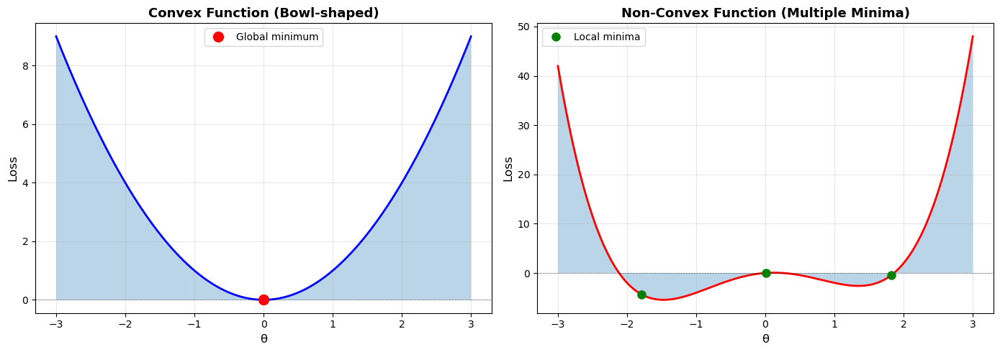

In [16]:
# Visualize convex vs non-convex
fig, axes = plot_convex_vs_nonconvex()
plt.show()

## Non-Convex Functions

**Characteristics:**
- Multiple local minima
- Saddle points (gradient = 0 but not a minimum)
- Plateaus (flat regions)
- Typical in modern AI models (e.g., neural networks)

**Challenges:**
- Gradient descent may get stuck in local minima
- Initial guess matters
- Slower convergence

**Why GD still works in practice:**
- Many local minima have similar loss values
- Noise from SGD helps escape saddle points
- Overparameterization smooths the landscape

**Key Insight:** We don't need the global minimum - a "good enough" solution often works!

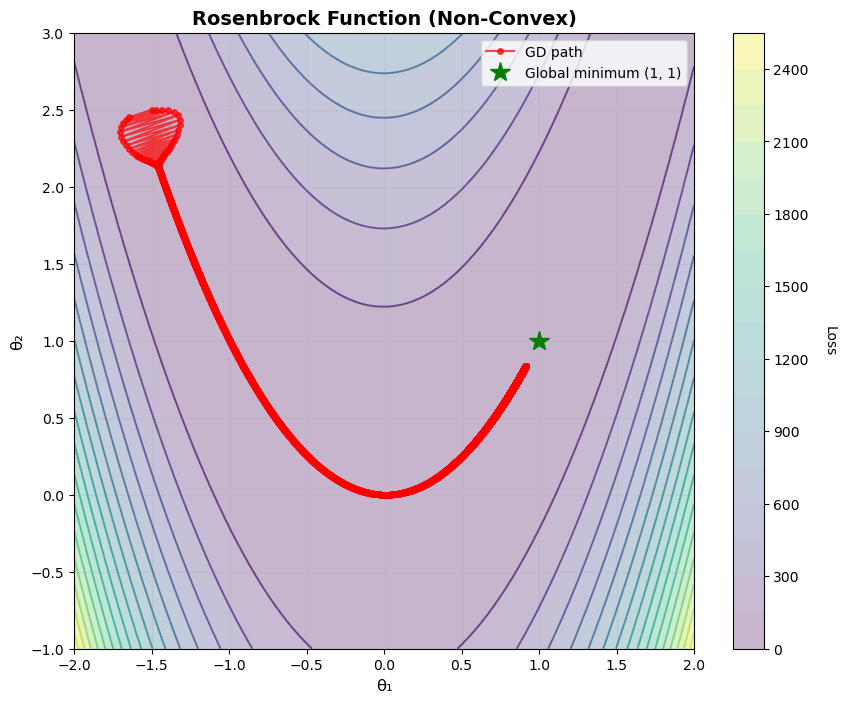

Final θ: [0.9141, 0.8352]
Global minimum: [1.0000, 1.0000]
Distance from global min: 0.1859


In [18]:
# Demonstrate GD on non-convex function (Rosenbrock)
loss_fn_nc = rosenbrock
grad_fn_nc = lambda theta: compute_gradient(loss_fn_nc, theta)

theta_init_nc = np.array([-1.5, 2.5])
result_nc = gradient_descent(loss_fn_nc, grad_fn_nc, theta_init_nc,
                            learning_rate=0.001, max_iters=5000)

# Visualize
fig, ax, _, _, _ = plot_loss_landscape_2d(loss_fn_nc, (-2, 2), (-1, 3),
                                           title='Rosenbrock Function (Non-Convex)')
ax.plot(result_nc['theta_history'][:, 0], result_nc['theta_history'][:, 1],
       'ro-', linewidth=1.5, markersize=4, alpha=0.7, label='GD path')
ax.plot(1, 1, 'g*', markersize=15, label='Global minimum (1, 1)')
ax.legend()
plt.show()

print(f"Final θ: [{result_nc['theta'][0]:.4f}, {result_nc['theta'][1]:.4f}]")
print(f"Global minimum: [1.0000, 1.0000]")
print(f"Distance from global min: {np.linalg.norm(result_nc['theta'] - np.array([1, 1])):.4f}")

### 🎮 Interactive Widget: Convexity Explorer

In [ ]:
convexity_widget()

interactive(children=(Dropdown(description='Function:', options=('Quadratic (Convex)', 'Rosenbrock (Non-convex…

# 🗺️ Section 6: Loss Landscapes

## Visualizing Loss Landscapes

The **loss landscape** is the surface formed by the loss function over the parameter space.

**Features of loss landscapes:**
- **Valleys:** Regions of low loss
- **Ridges:** Narrow paths with steep sides
- **Saddle points:** Points where gradient = 0 but not a minimum
- **Plateaus:** Flat regions with near-zero gradients

**Importance:** Understanding the landscape helps us:
- Choose appropriate learning rates
- Understand convergence behavior
- Design better optimization algorithms

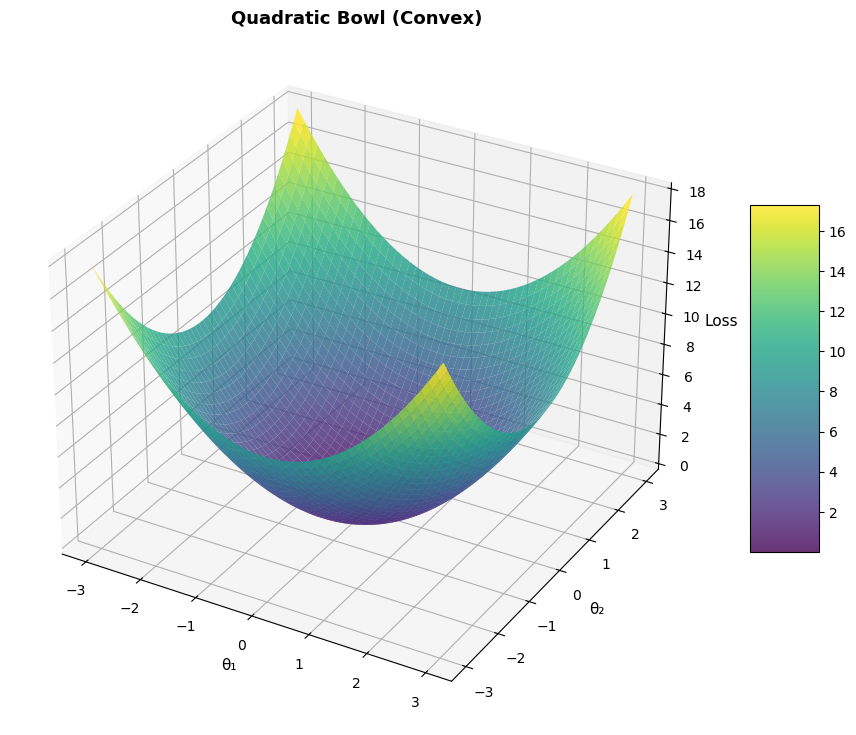

In [20]:
# 3D visualization of loss landscape
fig, ax = plot_loss_landscape_3d(quadratic_bowl, (-3, 3), (-3, 3), 
                                 title='Quadratic Bowl (Convex)')
plt.show()

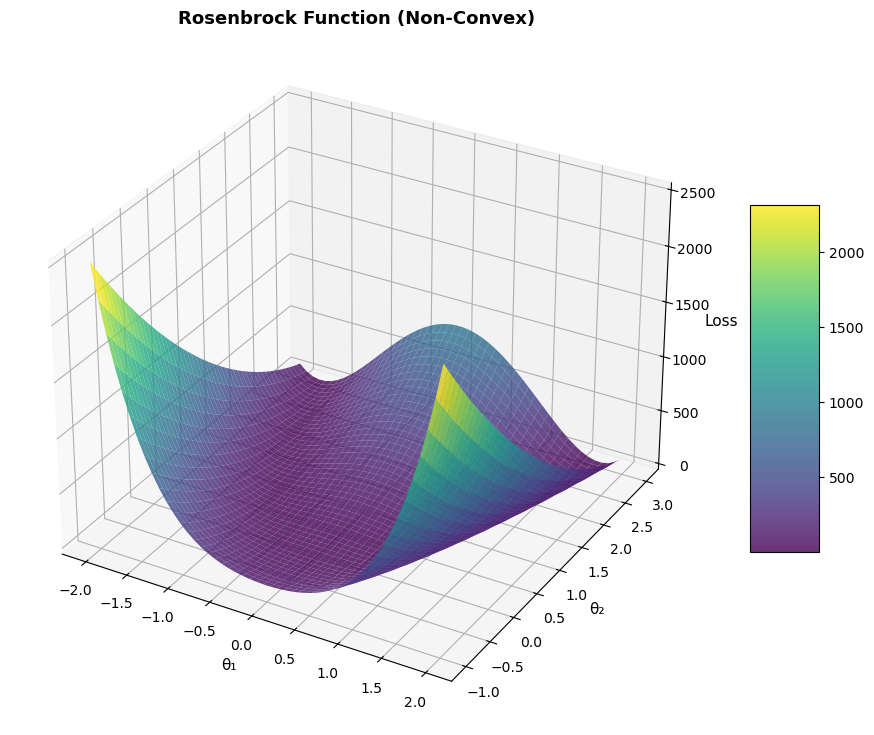

In [21]:
# 3D visualization of non-convex landscape
fig, ax = plot_loss_landscape_3d(rosenbrock, (-2, 2), (-1, 3),
                                 title='Rosenbrock Function (Non-Convex)')
plt.show()

## Gradient Field Visualization

The gradient field shows the direction of steepest ascent at each point.
Gradient descent follows the **negative** of these arrows.

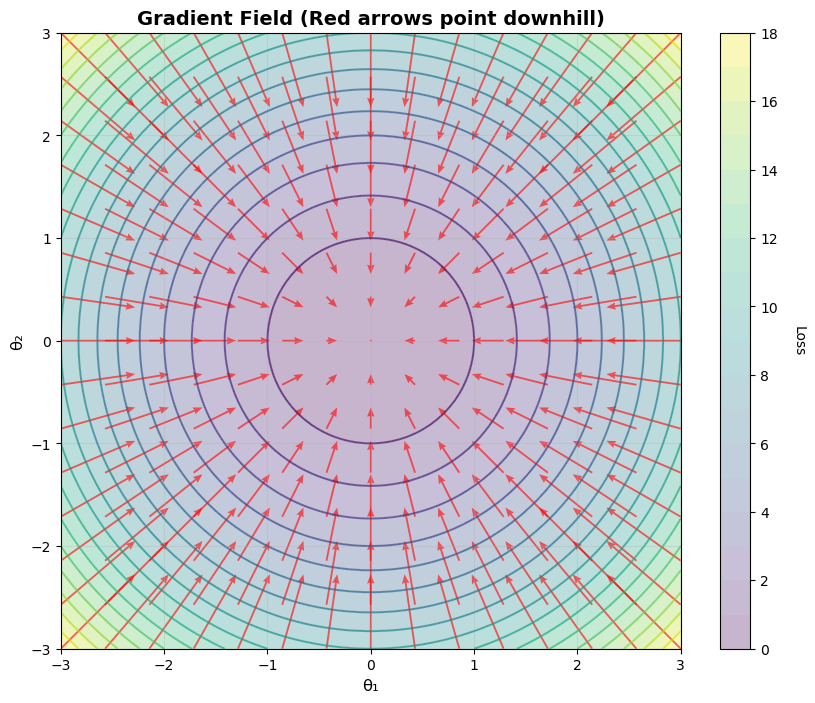

In [22]:
# Visualize gradient field
fig, ax = plot_gradient_field(quadratic_bowl, 
                              lambda theta: compute_gradient(quadratic_bowl, theta),
                              (-3, 3), (-3, 3), resolution=15,
                              title='Gradient Field (Red arrows point downhill)')
plt.show()

### 🎬 Animation: Gradient Descent Path

In [23]:
# Animate gradient descent
theta_init_anim = np.array([2.5, 2.5])
result_anim = gradient_descent(quadratic_bowl, 
                               lambda theta: compute_gradient(quadratic_bowl, theta),
                               theta_init_anim, learning_rate=0.1, max_iters=30)

anim = animate_gradient_descent(quadratic_bowl, result_anim['theta_history'],
                                (-3, 3), (-3, 3), interval=200,
                                title='Gradient Descent Animation')
display(anim)

# ⚖️ Section 7: Bias-Variance Tradeoff

## The Fundamental Tradeoff

In machine learning, our goal is not just to fit training data, but to **generalize** to unseen data.

**Two types of errors:**
1. **High Bias (Underfitting):** Model is too simple, misses important patterns
2. **High Variance (Overfitting):** Model is too complex, fits noise instead of signal

**Mathematical Decomposition:**

For data $y_i = f(x_i) + \varepsilon_i$ where $\varepsilon_i \sim N(0, \sigma^2)$:

$$\text{MSE} = \text{Bias}^2 + \text{Variance} + \sigma^2$$

where:
- **Bias:** $(f(x) - E[\hat{f}(x)])^2$ - how far average prediction is from truth
- **Variance:** $E[(\hat{f}(x) - E[\hat{f}(x)])^2]$ - how much predictions vary across datasets
- $\sigma^2$: irreducible error (noise)

## Visualizing Bias-Variance

**High Bias (Underfitting):**
- Model too simple (e.g., linear fit to nonlinear data)
- High training error
- High test error
- Solution: Use more complex model

**High Variance (Overfitting):**
- Model too complex (e.g., high-degree polynomial)
- Low training error
- High test error
- Solution: Get more data, use regularization

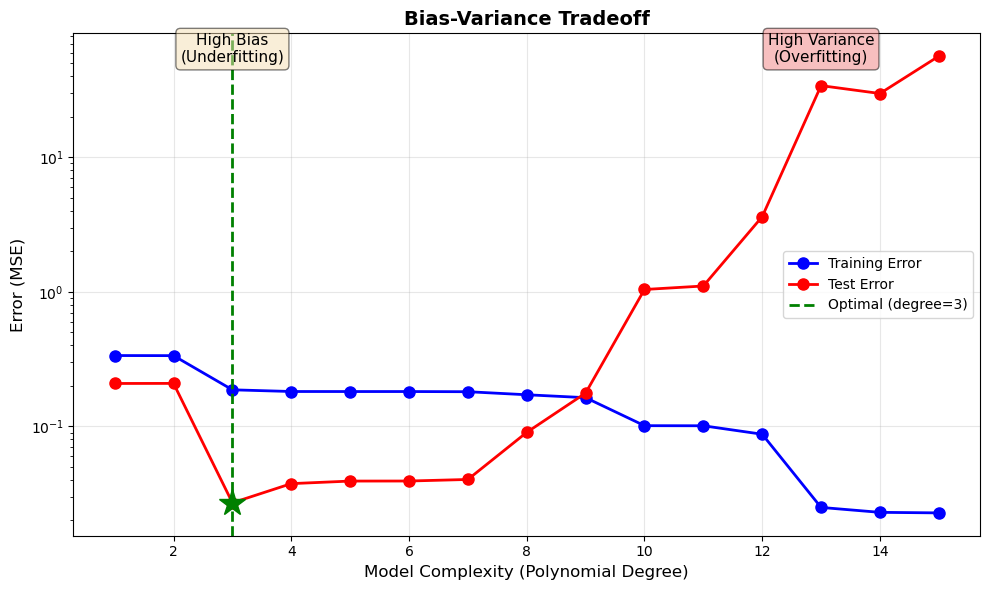

Optimal polynomial degree: 3
Test error at optimal: 0.0270


In [24]:
# Simulate overfitting with polynomial regression
result_overfit = simulate_overfitting(n_samples=20, degree_range=(1, 15),
                                     noise_std=0.5, seed=42)

# Find optimal degree
optimal_idx = np.argmin(result_overfit['test_errors'])
optimal_degree = result_overfit['degrees'][optimal_idx]

# Plot bias-variance tradeoff
fig, ax = plot_bias_variance_tradeoff(result_overfit['degrees'],
                                      result_overfit['train_errors'],
                                      result_overfit['test_errors'],
                                      optimal_degree=optimal_degree)
plt.show()

print(f"Optimal polynomial degree: {optimal_degree}")
print(f"Test error at optimal: {result_overfit['test_errors'][optimal_idx]:.4f}")

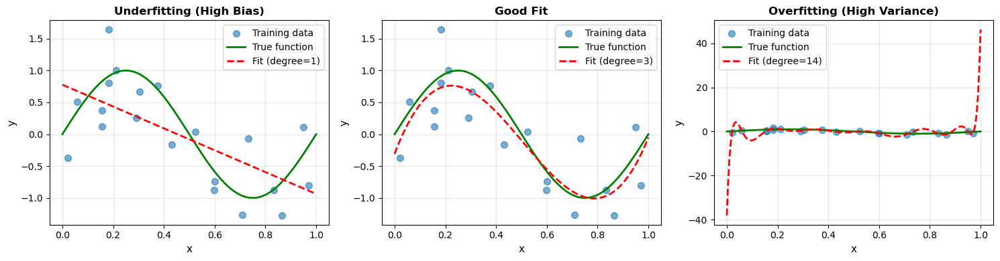

In [25]:
# Visualize underfitting, good fit, and overfitting
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

degrees_to_show = [1, optimal_degree, 14]
titles = ['Underfitting (High Bias)', 'Good Fit', 'Overfitting (High Variance)']

for i, (degree, title) in enumerate(zip(degrees_to_show, titles)):
    idx = result_overfit['degrees'].index(degree)
    theta = result_overfit['models'][idx]
    
    X_train = result_overfit['X_train']
    y_train = result_overfit['y_train']
    X_test = result_overfit['X_test']
    y_test = result_overfit['y_test']
    
    X_test_poly = np.column_stack([X_test**j for j in range(degree + 1)])
    y_pred = X_test_poly @ theta
    
    axes[i].scatter(X_train, y_train, s=50, alpha=0.6, label='Training data')
    axes[i].plot(X_test, y_test, 'g-', linewidth=2, label='True function')
    axes[i].plot(X_test, y_pred, 'r--', linewidth=2, label=f'Fit (degree={degree})')
    axes[i].set_xlabel('x', fontsize=11)
    axes[i].set_ylabel('y', fontsize=11)
    axes[i].set_title(title, fontsize=12, fontweight='bold')
    axes[i].legend()
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### 🎮 Interactive Widget: Bias-Variance Explorer

In [26]:
bias_variance_widget()

interactive(children=(IntSlider(value=20, description='Training Samples:', max=50, min=10, step=10, style=Slid…

# 🛡️ Section 8: Regularization Basics

## What is Regularization?

**Regularization** is a technique to prevent overfitting by penalizing model complexity.

**General form:**

$$\min_{\theta} \frac{1}{N} \sum_{i=1}^N L(y_i, f(x_i; \theta)) + \lambda \Omega(\theta)$$

where:
- First term: data fitting (minimize training error)
- Second term: regularization (penalize complexity)
- $\lambda \geq 0$: regularization strength (hyperparameter)
- $\Omega(\theta)$: regularization function

**Effect:**
- Reduces variance (prevents overfitting)
- May slightly increase bias
- Improves generalization to unseen data

## Why Regularization Works

**Intuition:** Simpler models are more likely to generalize well.

**Occam's Razor:** Among competing hypotheses, the simplest is usually correct.

**Regularization encourages:**
- Small parameter values
- Sparse solutions (many parameters = 0)
- Smooth functions
- Robustness to noise

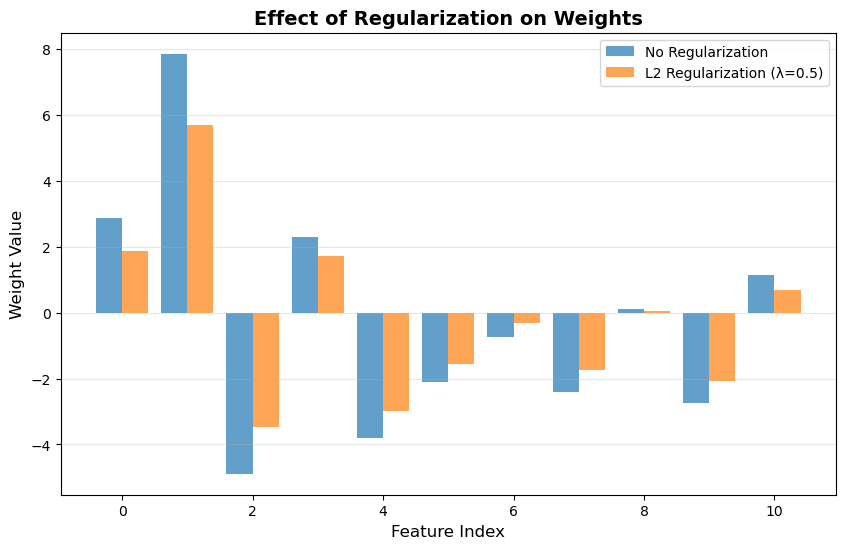

Weight Comparison:
  No regularization - L2 norm: 11.5412
  L2 regularization - L2 norm: 8.3742


In [27]:
# Demonstrate effect of regularization
data_reg = create_regression_data(n_samples=50, n_features=10, noise_std=1.0, seed=42)
X_reg, y_reg = data_reg['X'], data_reg['y']

# Fit without regularization
theta_init_reg = np.zeros(X_reg.shape[1])
loss_fn_no_reg = lambda theta: mse_loss(theta, X_reg, y_reg)
grad_fn_no_reg = lambda theta: mse_gradient(theta, X_reg, y_reg)

result_no_reg = gradient_descent(loss_fn_no_reg, grad_fn_no_reg, theta_init_reg,
                                learning_rate=0.01, max_iters=100)

# Fit with L2 regularization
lambda_reg = 0.5
loss_fn_l2 = lambda theta: mse_with_l2_reg(theta, X_reg, y_reg, lambda_reg)
from utils.Lecture_04.loss_functions import mse_with_l2_gradient
grad_fn_l2 = lambda theta: mse_with_l2_gradient(theta, X_reg, y_reg, lambda_reg)

result_l2 = gradient_descent(loss_fn_l2, grad_fn_l2, theta_init_reg,
                            learning_rate=0.01, max_iters=100)

# Compare weights
fig, ax = plt.subplots(figsize=(10, 6))
feature_indices = range(len(result_no_reg['theta']))
ax.bar([i - 0.2 for i in feature_indices], result_no_reg['theta'], 
      width=0.4, label='No Regularization', alpha=0.7)
ax.bar([i + 0.2 for i in feature_indices], result_l2['theta'], 
      width=0.4, label=f'L2 Regularization (λ={lambda_reg})', alpha=0.7)
ax.set_xlabel('Feature Index', fontsize=12)
ax.set_ylabel('Weight Value', fontsize=12)
ax.set_title('Effect of Regularization on Weights', fontsize=14, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3, axis='y')
plt.show()

print("Weight Comparison:")
print(f"  No regularization - L2 norm: {np.linalg.norm(result_no_reg['theta']):.4f}")
print(f"  L2 regularization - L2 norm: {np.linalg.norm(result_l2['theta']):.4f}")

# 📐 Section 9: L1 and L2 Regularization

## L1 Regularization (LASSO)

**Regularization term:**

$$\Omega(\theta) = \|\theta\|_1 = \sum_i |\theta_i|$$

**Properties:**
- Drives many parameters to **exactly zero** (sparsity)
- Implicit feature selection
- Non-differentiable at zero (needs special handling)

**Use cases:**
- Feature selection
- Interpretable models
- High-dimensional data

## L2 Regularization (Ridge)

**Regularization term:**

$$\Omega(\theta) = \|\theta\|_2^2 = \sum_i \theta_i^2$$

**Properties:**
- Encourages small weights (but not exactly zero)
- Smooth, differentiable
- Gradient: $\nabla \Omega(\theta) = 2\lambda\theta$

**Use cases:**
- Most common in practice
- Stable optimization
- Prevents large weights

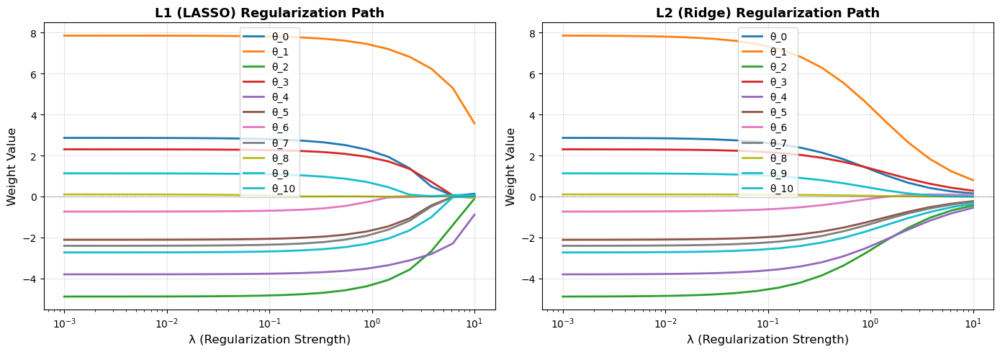

Key Observations:
  L1 (LASSO): Drives weights to exactly zero (sparse)
  L2 (Ridge): Shrinks weights smoothly toward zero


In [28]:
# Compare L1 vs L2 regularization paths
lambdas = np.logspace(-3, 1, 20)
weights_l1 = []
weights_l2 = []

for lam in lambdas:
    # L1
    from utils.Lecture_04.loss_functions import mse_with_l1_gradient
    loss_l1 = lambda theta: mse_with_l1_reg(theta, X_reg, y_reg, lam)
    grad_l1 = lambda theta: mse_with_l1_gradient(theta, X_reg, y_reg, lam)
    result_l1 = gradient_descent(loss_l1, grad_l1, theta_init_reg,
                                learning_rate=0.01, max_iters=100)
    weights_l1.append(result_l1['theta'])
    
    # L2
    loss_l2 = lambda theta: mse_with_l2_reg(theta, X_reg, y_reg, lam)
    grad_l2 = lambda theta: mse_with_l2_gradient(theta, X_reg, y_reg, lam)
    result_l2 = gradient_descent(loss_l2, grad_l2, theta_init_reg,
                                learning_rate=0.01, max_iters=100)
    weights_l2.append(result_l2['theta'])

weights_l1 = np.array(weights_l1)
weights_l2 = np.array(weights_l2)

# Plot regularization paths
fig, axes = plot_regularization_paths(lambdas, weights_l1, weights_l2)
plt.show()

print("Key Observations:")
print("  L1 (LASSO): Drives weights to exactly zero (sparse)")
print("  L2 (Ridge): Shrinks weights smoothly toward zero")

## Elastic Net Regularization

**Combines L1 and L2:**

$$\Omega(\theta) = \lambda_1 \|\theta\|_1 + \lambda_2 \|\theta\|_2^2$$

**Advantages:**
- Enjoys benefits of both L1 and L2
- Handles correlated features better
- More stable than pure L1

**Use cases:**
- When features are correlated
- Want both sparsity and stability

### 🎮 Interactive Widget: Regularization Explorer

In [29]:
regularization_widget()

interactive(children=(FloatSlider(value=0.5, description='λ (Regularization):', max=2.0, style=SliderStyle(des…

# 🎲 Section 10: Dropout Regularization

## Dropout: Data-Based Regularization

**Idea:** During training, randomly "drop" (set to zero) a fraction of parameters at each iteration.

**Algorithm:**
1. For each training iteration:
   - Randomly select parameters with probability $p$ (e.g., 0.5)
   - Set selected parameters to zero
   - Compute gradient and update (only non-dropped parameters)
2. At test time: Use all parameters

**Effect:**
- Forces model to learn redundant representations
- Prevents over-reliance on any single parameter
- Acts as ensemble of many sub-models

**Tradeoff:**
- Reduces variance (prevents overfitting)
- May slightly increase bias

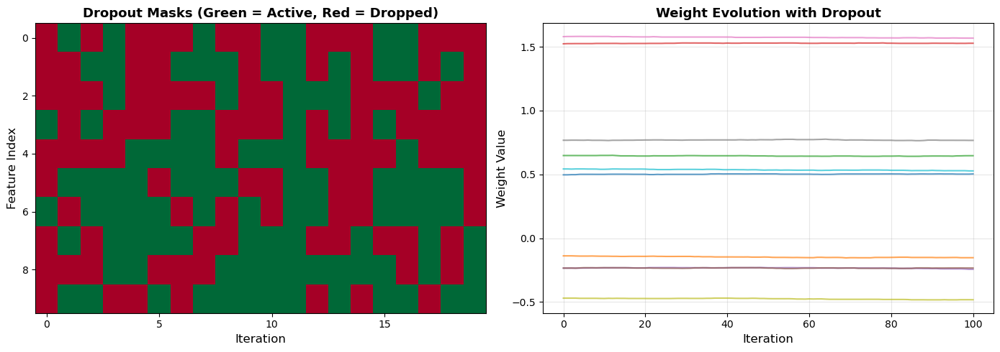

Dropout rate: 0.5
Average active features per iteration: 4.9/10


In [30]:
# Demonstrate dropout effect
dropout_result = demonstrate_dropout(n_features=10, dropout_rate=0.5, 
                                    n_iterations=100, seed=42)

# Visualize dropout masks
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Show first 20 iterations of dropout masks
masks = np.array(dropout_result['active_features_history'][:20])
ax1.imshow(masks.T, cmap='RdYlGn', aspect='auto', interpolation='nearest')
ax1.set_xlabel('Iteration', fontsize=12)
ax1.set_ylabel('Feature Index', fontsize=12)
ax1.set_title('Dropout Masks (Green = Active, Red = Dropped)', fontsize=13, fontweight='bold')
ax1.set_xticks(range(0, 20, 5))

# Weight evolution
weights_history = dropout_result['weights_history']
for i in range(dropout_result['weights_history'].shape[1]):
    ax2.plot(weights_history[:, i], alpha=0.7, linewidth=1.5)
ax2.set_xlabel('Iteration', fontsize=12)
ax2.set_ylabel('Weight Value', fontsize=12)
ax2.set_title('Weight Evolution with Dropout', fontsize=13, fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Dropout rate: {dropout_result['dropout_rate']}")
print(f"Average active features per iteration: {dropout_result['info']['avg_active']:.1f}/{dropout_result['info']['n_features']}")

# 🔄 Section 11: Data Augmentation

## Data Augmentation: Another Regularization Approach

**Idea:** Artificially increase training data by applying **label-preserving transformations**.

**Examples in different domains:**
- **Images:** Rotation, flipping, cropping, color jittering
- **Text:** Synonym replacement, back-translation
- **Time series:** Time warping, jittering

**CE Examples:**
- **Structural analysis:** Small variations in load positions
- **Material testing:** Measurement noise simulation
- **Sensor data:** Adding realistic noise patterns

**Effect:**
- Reduces both bias and variance
- Teaches model what variations should **not** change the output
- Often outperforms explicit regularization

### CE Example: Augmenting Structural Load Data

Suppose we have measurements of beam deflection under various loads.
We can augment by:
- Adding small measurement noise
- Slightly varying load positions
- Simulating different support conditions

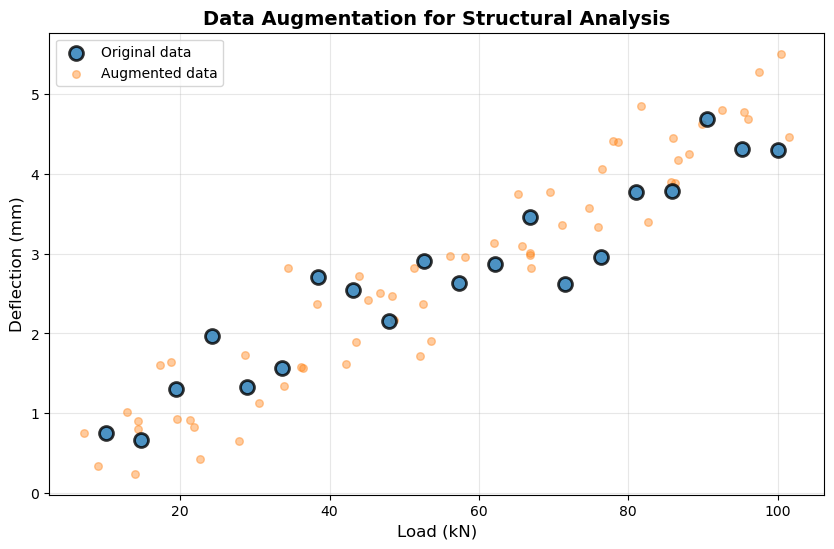

Original dataset size: 20
Augmented dataset size: 80
Augmentation factor: 4x


In [31]:
# Simple data augmentation example
np.random.seed(42)

# Original data: beam deflection vs load
loads_original = np.linspace(10, 100, 20)
deflections_original = 0.05 * loads_original + np.random.randn(20) * 0.5

# Augmented data: add noise and slight variations
n_augmentations = 3
loads_augmented = []
deflections_augmented = []

for _ in range(n_augmentations):
    # Add small variations to loads
    loads_aug = loads_original + np.random.randn(20) * 2
    # Add measurement noise to deflections
    deflections_aug = 0.05 * loads_aug + np.random.randn(20) * 0.5
    loads_augmented.extend(loads_aug)
    deflections_augmented.extend(deflections_aug)

loads_augmented = np.array(loads_augmented)
deflections_augmented = np.array(deflections_augmented)

# Visualize
plt.figure(figsize=(10, 6))
plt.scatter(loads_original, deflections_original, s=100, alpha=0.8, 
           edgecolors='black', linewidth=2, label='Original data', zorder=3)
plt.scatter(loads_augmented, deflections_augmented, s=30, alpha=0.4,
           label='Augmented data', zorder=2)
plt.xlabel('Load (kN)', fontsize=12)
plt.ylabel('Deflection (mm)', fontsize=12)
plt.title('Data Augmentation for Structural Analysis', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print(f"Original dataset size: {len(loads_original)}")
print(f"Augmented dataset size: {len(loads_original) + len(loads_augmented)}")
print(f"Augmentation factor: {1 + n_augmentations}x")

# 🏗️ Section 12: CE Optimization Example

## Structural Beam Optimization

**Problem:** Minimize beam weight subject to stress and deflection constraints.

**Design variables:**
- Width $w$ (m)
- Height $h$ (m)

**Objective:**
$$\min_{w, h} \text{Weight} \propto w \cdot h$$

**Constraints:**
- Stress: $\sigma = \frac{M \cdot c}{I} \leq \sigma_{\text{allow}}$
- Deflection: $\delta = \frac{5wL^4}{384EI} \leq \delta_{\text{allow}}$

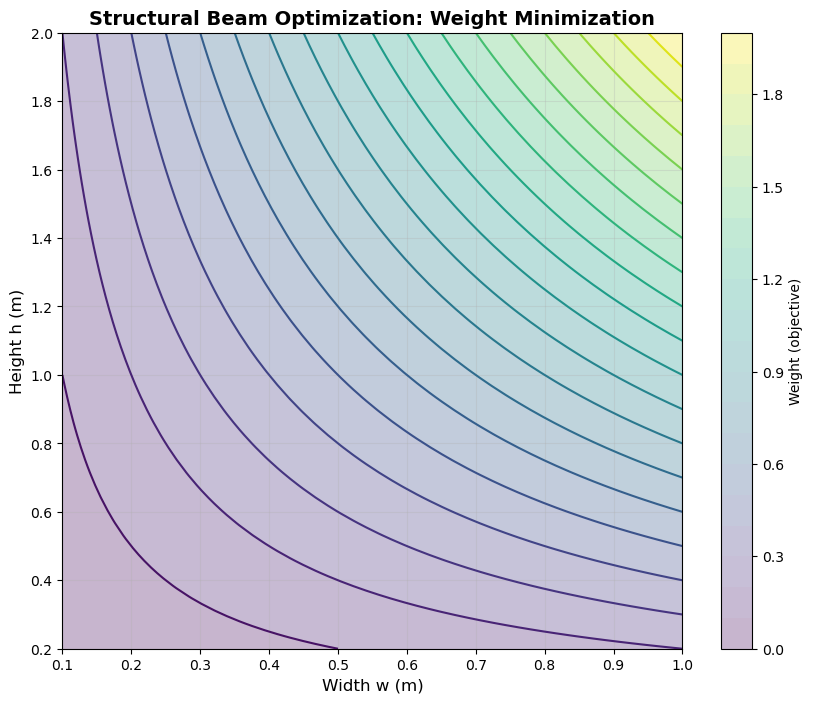

Optimization Problem:
  Objective: Minimize beam weight
  Variables: ['width (m)', 'height (m)']
  Bounds: [(0.1, 1.0), (0.2, 2.0)]


In [32]:
# Create structural optimization problem
struct_opt = create_structural_optimization()

# Visualize objective function
w_range = np.linspace(0.1, 1.0, 50)
h_range = np.linspace(0.2, 2.0, 50)
W, H = np.meshgrid(w_range, h_range)

# Evaluate objective
Z_obj = np.zeros_like(W)
for i in range(len(w_range)):
    for j in range(len(h_range)):
        Z_obj[j, i] = struct_opt['objective']([W[j, i], H[j, i]])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
contour = ax.contour(W, H, Z_obj, levels=20, cmap='viridis')
contourf = ax.contourf(W, H, Z_obj, levels=20, cmap='viridis', alpha=0.3)
plt.colorbar(contourf, ax=ax, label='Weight (objective)')

ax.set_xlabel('Width w (m)', fontsize=12)
ax.set_ylabel('Height h (m)', fontsize=12)
ax.set_title('Structural Beam Optimization: Weight Minimization', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)

plt.show()

print("Optimization Problem:")
print(f"  Objective: Minimize beam weight")
print(f"  Variables: {struct_opt['info']['variables']}")
print(f"  Bounds: {struct_opt['info']['bounds']}")

## Project Cost Optimization

**Problem:** Minimize total project cost as a function of material grades.

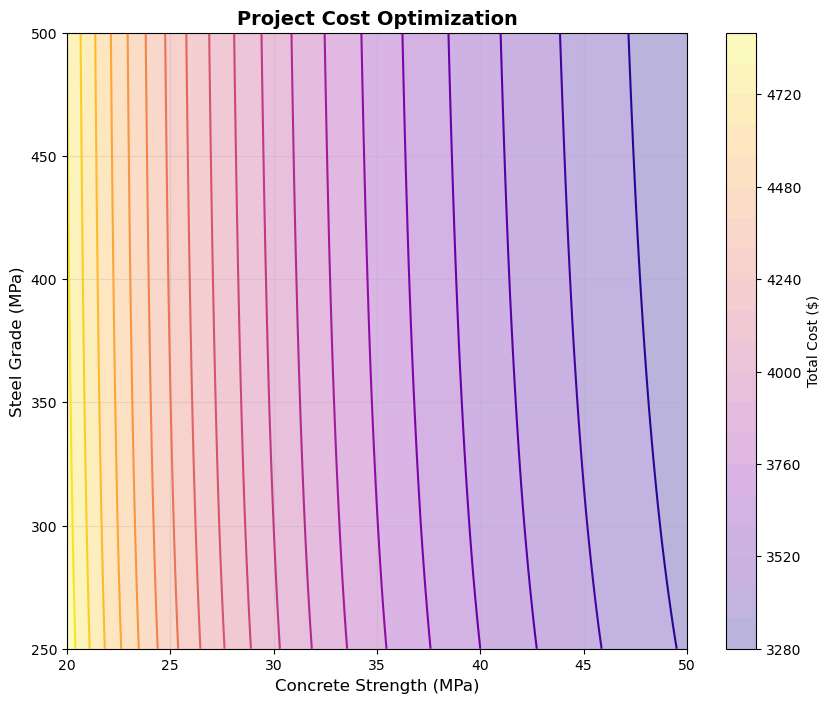

Optimal concrete strength: 197.58 MPa
Optimal steel grade: 359.92 MPa
Minimum cost: $2572.52


In [33]:
# Create cost optimization problem
cost_opt = create_cost_function()

# Visualize cost function
fc_range = np.linspace(20, 50, 50)
fy_range = np.linspace(250, 500, 50)
FC, FY = np.meshgrid(fc_range, fy_range)

Z_cost = np.zeros_like(FC)
for i in range(len(fc_range)):
    for j in range(len(fy_range)):
        Z_cost[j, i] = cost_opt['cost_fn']([FC[j, i], FY[j, i]])

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
contour = ax.contour(FC, FY, Z_cost, levels=20, cmap='plasma')
contourf = ax.contourf(FC, FY, Z_cost, levels=20, cmap='plasma', alpha=0.3)
plt.colorbar(contourf, ax=ax, label='Total Cost ($)')

ax.set_xlabel('Concrete Strength (MPa)', fontsize=12)
ax.set_ylabel('Steel Grade (MPa)', fontsize=12)
ax.set_title('Project Cost Optimization', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)

plt.show()

# Find optimal using gradient descent
theta_init_cost = np.array([30.0, 350.0])
result_cost = gradient_descent(cost_opt['cost_fn'], cost_opt['gradient_fn'],
                               theta_init_cost, learning_rate=0.5, max_iters=100)

print(f"Optimal concrete strength: {result_cost['theta'][0]:.2f} MPa")
print(f"Optimal steel grade: {result_cost['theta'][1]:.2f} MPa")
print(f"Minimum cost: ${result_cost['loss']:.2f}")

# 📚 Section 13: Summary & Key Takeaways

## 🎯 Key Concepts Covered

### 1. **Gradient Descent**
- Update rule: $\theta_{t+1} = \theta_t - \eta \nabla L(\theta_t)$
- Gradient points uphill, we move downhill
- Iterative optimization algorithm

### 2. **Learning Rate**
- Critical hyperparameter $\eta$
- Too small: slow convergence
- Too large: divergence
- Schedules: step, exponential, cosine

### 3. **Batch vs SGD vs Minibatch**
- **Batch:** Use all data (accurate but slow)
- **SGD:** Use one sample (fast but noisy)
- **Minibatch:** Use small batches (best of both)

### 4. **Convexity**
- **Convex:** Single global minimum, GD guaranteed to converge
- **Non-convex:** Multiple local minima, saddle points
- Modern AI: mostly non-convex, but GD still works

### 5. **Bias-Variance Tradeoff**
- **Bias:** Model too simple (underfitting)
- **Variance:** Model too complex (overfitting)
- $\text{MSE} = \text{Bias}^2 + \text{Variance} + \sigma^2$

### 6. **Regularization**
- **L1 (LASSO):** Sparsity, feature selection
- **L2 (Ridge):** Smooth shrinkage, most common
- **Elastic Net:** Combination of L1 and L2
- **Dropout:** Random parameter dropping
- **Data Augmentation:** Increase training data

## 🔗 Connections to Machine Learning

| Optimization Concept | ML Application |
|----------------------|----------------|
| Gradient Descent | Training neural networks |
| Learning Rate | Hyperparameter tuning |
| SGD/Minibatch | Large-scale training |
| Convexity | Loss function design |
| Bias-Variance | Model selection |
| Regularization | Preventing overfitting |
| L1 Regularization | Feature selection, sparse models |
| L2 Regularization | Weight decay in neural networks |
| Dropout | Neural network regularization |
| Data Augmentation | Computer vision, NLP |

## 💡 Key Insights for CE

1. **Optimization is everywhere:** Structural design, cost minimization, resource allocation
2. **Tradeoffs matter:** Cost vs safety, complexity vs interpretability
3. **Constraints are critical:** Safety factors, building codes, material limits
4. **Uncertainty is real:** Use regularization to handle variability
5. **Data quality matters:** Augmentation can improve robustness
6. **Local optima are okay:** Don't need perfect solution, "good enough" often works
7. **Hyperparameters need tuning:** Learning rate, regularization strength

## 📖 Further Reading

1. **Books:**
   - *Convex Optimization* by Boyd & Vandenberghe
   - *Deep Learning* by Goodfellow, Bengio & Courville
   - *The Elements of Statistical Learning* by Hastie, Tibshirani & Friedman

2. **Online Resources:**
   - Stanford CS229: Machine Learning
   - MIT 18.065: Matrix Methods in Data Analysis
   - Distill.pub: Visual explanations of ML concepts

3. **Practice:**
   - Implement gradient descent from scratch
   - Experiment with different learning rates
   - Try L1 vs L2 on real datasets
   - Optimize a CE design problem

## 🎓 Review Questions

1. What is the gradient descent update rule?
2. Why does learning rate matter?
3. What's the difference between batch GD and SGD?
4. How do you identify a convex function?
5. What causes overfitting? How does regularization help?
6. When would you use L1 vs L2 regularization?
7. How does dropout prevent overfitting?
8. What is the bias-variance tradeoff?
9. Why is data augmentation effective?
10. How do you choose the regularization strength λ?

# 🎉 Congratulations!

You've completed the Optimization and Loss Landscapes notebook!

**You should now understand:**
- ✓ Gradient descent and its variants
- ✓ Learning rate effects and schedules
- ✓ Convex vs non-convex optimization
- ✓ Loss landscapes and their features
- ✓ Bias-variance tradeoff
- ✓ Regularization techniques (L1, L2, Dropout, Data Augmentation)
- ✓ Applications to CE optimization problems

**Next Lecture:** Vector Calculus and Backpropagation

*Notebook created for CE639: AI for Civil Engineering*  
*IIT Gandhinagar*